#Inspeção dos dados com Python

Objetivo:

 Compreender as tendências, padrões e características das vendas farmacêuticas em diferentes regiões e demografias.


**Fonte: Polícia Rodoviária Federal**

In [48]:
# Mapeando bibliotecas necessárias para o projeto

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [40]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [71]:
df_prf_oco_01 = pd.read_csv('/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/PRF/PRF.2023/Dados_PRF_2023.csv',
                            delimiter=';',
                            encoding='latin1'
                            )
df_prf_oco_01.shape

(32440, 30)

In [72]:
df = pd.read_csv(
    filepath_or_buffer='/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/PRF/PRF.2023/Dados_PRF_2023.csv',   # Caminho ou objeto similar a arquivo que representa o CSV.
    sep=';',              # Delimitador a ser usado. Padrão é ','.
    # delimiter=';',       # Alias para sep.
    # header='infer',       # Linha a ser usada como nome das colunas. Padrão é 'infer', o que significa que pandas tentará inferir automaticamente.
    # names=None,           # Lista de nomes de colunas a serem usadas.
    # index_col=None,       # Coluna(s) a serem usadas como índice (linha) do DataFrame.
    # usecols=None,         # Colunas a serem lidas do CSV.
    # dtype=None,           # Tipo de dados para colunas.
    # engine=None,          # Parser a ser usado. Pode ser 'c' (padrão) ou 'python'.
    # converters=None,      # Dicionário de funções para converter valores em determinadas colunas.
    # true_values=None,     # Sequência de valores a serem tratados como True.
    # false_values=None,    # Sequência de valores a serem tratados como False.
    # skipinitialspace=False, # Pula espaços após o delimitador.
    # skiprows=None,        # Número de linhas a serem puladas no início do arquivo.
    # nrows=None,           # Número de linhas a serem lidas do arquivo.
    # na_values=None,       # Sequência de valores a serem tratados como NaN.
    # keep_default_na=True, # Se os valores padrão devem ser mantidos como NaN.
    # na_filter=True,       # Detectar valores faltantes (NaN).
    # verbose=False,        # Imprimir informações adicionais, como o número de valores faltantes.
    # skip_blank_lines=True, # Pular linhas em branco.
    # parse_dates=False,    # Colunas a serem analisadas como datas.
    # infer_datetime_format=False, # Inferir o formato da data.
    # keep_date_col=False,  # Se True, mantém as colunas originais que foram analisadas como datas.
    # date_parser=None,     # Função a ser usada para analisar datas.
    # dayfirst=False,       # Tratar o primeiro valor na data como dia (DD/MM/YYYY).
    # cache_dates=True,     # Cache de objetos de data únicos.
    # iterator=False,       # Retornar um objeto TextFileReader para iteração.
    # chunksize=None,       # Tamanho das partes a serem lidas do arquivo.
    # compression='infer',  # Tipo de compressão do arquivo. Padrão é 'infer', que tenta inferir a partir da extensão do arquivo (como '.gz' ou '.zip').
    # thousands=None,       # Caractere a ser reconhecido como separador de milhar (por exemplo, ',' em "2,000").
    # decimal='.',          # Caractere a ser reconhecido como separador decimal (por exemplo, ',' em "2,5").
    # lineterminator=None,  # Caractere que termina a linha no arquivo.
    # quotechar='"',        # Caractere usado para citar campos.
    # quoting=0,            # Regras de citação. Pode ser 0 (minimal), 1 (all), 2 (non-numeric), ou 3 (none). Padrão é 0.
    # escapechar=None,      # Caractere de escape.
    # comment=None,         # Caractere(s) que começam um comentário.
    encoding='ISO-8859-1',        # Codificação a ser usada.
    # dialect=None,         # Dialeto SQL a ser usado.
    # error_bad_lines=True, # Se linhas com muitos campos (em relação ao esperado) devem gerar exceção (True) ou serem puladas (False).
    # warn_bad_lines=True,  # Se deve imprimir um aviso para linhas com muitos campos.
    # delim_whitespace=False, # Usar espaços em branco (espaço e tabulação) como delimitador.
    # low_memory=True,      # Internamente fragmenta o arquivo para economizar memória.
    # memory_map=False,     # Mapeia o arquivo em memória para leitura. Pode ser útil para arquivos muito grandes.
    # float_precision=None  # Especifica qual conversor o C deve usar para strings de ponto flutuante.
 )

df.shape

(32440, 30)

In [73]:
# Visualizar as 5 primeiras linhas do arquivo
df_prf_oco_01.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,496519,2023-01-01,domingo,02:00:00,ES,101.0,114,SOORETAMA,Ausência de reação do condutor,Saída de leito carroçável,...,0,0,0,1,1,"-19,09484877","-40,05095848",SPRF-ES,DEL04-ES,UOP01-DEL04-ES
1,496543,2023-01-01,domingo,03:40:00,SP,116.0,"113,1",TAUBATE,Entrada inopinada do pedestre,Atropelamento de Pedestre,...,0,0,4,0,1,"-23,0445658","-45,58259814",SPRF-SP,DEL02-SP,UOP02-DEL02-SP
2,496590,2023-01-01,domingo,01:40:00,MT,163.0,1112,GUARANTA DO NORTE,Reação tardia ou ineficiente do condutor,Tombamento,...,1,0,0,1,1,"-9,70020602","-54,87588757",SPRF-MT,DEL06-MT,UOP03-DEL06-MT
3,496610,2023-01-01,domingo,10:40:00,PR,376.0,"314,8",ORTIGUEIRA,Velocidade Incompatível,Tombamento,...,0,1,0,0,1,"-23,985512","-51,083555",SPRF-PR,DEL07-PR,UOP02-DEL07-PR
4,496659,2023-01-01,domingo,14:55:00,MG,116.0,"569,4",MANHUACU,Acumulo de água sobre o pavimento,Colisão frontal,...,2,1,0,2,2,"-20,10007457","-42,17884091",SPRF-MG,DEL06-MG,UOP03-DEL06-MG


In [74]:
# Visualizar as últimas linhas do arquivo
df_prf_oco_01.tail()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
32435,536157,2023-06-25,domingo,05:10:00,SP,101.0,41,UBATUBA,Ingestão de álcool pelo condutor,Tombamento,...,0,1,0,0,1,"-23,41971433","-45,0428663",SPRF-SP,DEL06-SP,UOP01-DEL06-SP
32436,536172,2023-06-23,sexta-feira,02:30:00,RS,386.0,"279,4",SAO JOSE DO HERVAL,Condutor Dormindo,Saída de leito carroçável,...,1,0,0,1,1,"-29,02337709","-52,31543541",SPRF-RS,DEL04-RS,UOP03-DEL04-RS
32437,536173,2023-06-24,sábado,13:40:00,PR,163.0,"133,3",CAPITAO LEONIDAS MARQUES,Retorno proibido,Colisão transversal,...,0,2,0,3,2,"-25,55452378","-53,58756077",SPRF-PR,DEL05-PR,UOP05-DEL05-PR
32438,536265,2023-01-09,segunda-feira,10:00:00,MG,267.0,"80,5",JUIZ DE FORA,Condutor Dormindo,Saída de leito carroçável,...,0,1,0,0,1,"-21,75478617","-43,21241781",SPRF-MG,DEL05-MG,UOP01-DEL05-MG
32439,536330,2023-06-02,sexta-feira,15:30:00,SC,470.0,60,BLUMENAU,Retorno proibido,Colisão transversal,...,0,0,1,1,2,"-26,87957612","-49,1716308",SPRF-SC,DEL04-SC,UOP01-DEL04-SC


In [75]:
# verificando o tipo dos dados
df_prf_oco_01.dtypes

,0
id,int64
data_inversa,object
dia_semana,object
horario,object
uf,object
br,float64
km,object
municipio,object
causa_acidente,object
tipo_acidente,object


In [76]:
#Transformando as variaveis em uma lista
list(df_prf_oco_01.columns)

['id',
 'data_inversa',
 'dia_semana',
 'horario',
 'uf',
 'br',
 'km',
 'municipio',
 'causa_acidente',
 'tipo_acidente',
 'classificacao_acidente',
 'fase_dia',
 'sentido_via',
 'condicao_metereologica',
 'tipo_pista',
 'tracado_via',
 'uso_solo',
 'pessoas',
 'mortos',
 'feridos_leves',
 'feridos_graves',
 'ilesos',
 'ignorados',
 'feridos',
 'veiculos',
 'latitude',
 'longitude',
 'regional',
 'delegacia',
 'uop']

In [77]:
def generate_metadata(dataframe):
    """
    Gera um dataframe contendo metadados das colunas do dataframe fornecido.

    :param dataframe: DataFrame para o qual os metadados serão gerados.
    :return: DataFrame contendo metadados.
    """

    # Coleta de metadados básicos
    metadata = pd.DataFrame({
        'nome_variavel': dataframe.columns,
        'tipo': dataframe.dtypes,
        'qt_nulos': dataframe.isnull().sum(),
        'percent_nulos': round((dataframe.isnull().sum() / len(dataframe))* 100,2),
        'cardinalidade': dataframe.nunique(),
    })
    metadata=metadata.sort_values(by='tipo')
    metadata = metadata.reset_index(drop=True)

    return metadata

# Testando a função com o dataframe dados_prf_2023
metadata_df = generate_metadata(df_prf_oco_01)
metadata_df

,nome_variavel,tipo,qt_nulos,percent_nulos,cardinalidade
0,id,int64,0,0.00,32440
1,veiculos,int64,0,0.00,12
2,feridos,int64,0,0.00,28
3,ignorados,int64,0,0.00,10
4,ilesos,int64,0,0.00,43
5,feridos_graves,int64,0,0.00,14
6,feridos_leves,int64,0,0.00,24
7,mortos,int64,0,0.00,8
8,pessoas,int64,0,0.00,48
9,br,float64,78,0.24,114


In [78]:
df_prf_oco_01.shape

(32440, 30)

In [79]:
metadata_df.to_csv('/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/PRF/PRF.2023/acidentes2024_todas_causas_tipos (1)/acidentes2024_todas_causas_tipos.csv')

In [80]:
# Estatística descritiva apenas para numéricas
df_prf_oco_01.describe()

,id,br,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos
count,32440.000000,32362.000000,32440.000000,32440.000000,32440.000000,32440.000000,32440.000000,32440.000000,32440.000000,32440.000000
mean,515154.342170,209.846147,2.457614,0.081936,0.874723,0.277435,1.067109,0.156412,1.152158,1.664365
std,10528.741985,129.455175,2.166629,0.325561,1.083875,0.617148,1.758439,0.443078,1.194990,0.720026
min,496506.000000,10.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,506122.750000,101.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
50%,515290.500000,155.000000,2.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,2.000000
75%,524296.250000,324.000000,3.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,2.000000
max,536330.000000,495.000000,65.000000,7.000000,61.000000,29.000000,58.000000,14.000000,62.000000,12.000000


In [81]:
# Estatística descritiva completa
df_prf_oco_01.describe(include='all')

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
count,32440.000000,32440,32440,32440,32440,32362.000000,32362,32440,32440,32440,...,32440.000000,32440.000000,32440.000000,32440.000000,32440.000000,32440,32440,32437,32138,32422
unique,NaN,181,7,1307,27,NaN,6076,1705,71,16,...,NaN,NaN,NaN,NaN,NaN,20402,20401,28,146,392
top,NaN,2023-06-11,domingo,18:00:00,MG,NaN,1,BRASILIA,Reação tardia ou ineficiente do condutor,Colisão traseira,...,NaN,NaN,NaN,NaN,NaN,"-27,59193546","-48,61824557",SPRF-MG,DEL01-PR,UOP01-DEL01-SP
freq,NaN,248,5375,470,4234,NaN,152,464,4672,6179,...,NaN,NaN,NaN,NaN,NaN,47,47,4230,1170,542
mean,515154.342170,NaN,NaN,NaN,NaN,209.846147,NaN,NaN,NaN,NaN,...,0.277435,1.067109,0.156412,1.152158,1.664365,NaN,NaN,NaN,NaN,NaN
std,10528.741985,NaN,NaN,NaN,NaN,129.455175,NaN,NaN,NaN,NaN,...,0.617148,1.758439,0.443078,1.194990,0.720026,NaN,NaN,NaN,NaN,NaN
min,496506.000000,NaN,NaN,NaN,NaN,10.000000,NaN,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN
25%,506122.750000,NaN,NaN,NaN,NaN,101.000000,NaN,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN
50%,515290.500000,NaN,NaN,NaN,NaN,155.000000,NaN,NaN,NaN,NaN,...,0.000000,1.000000,0.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,NaN
75%,524296.250000,NaN,NaN,NaN,NaN,324.000000,NaN,NaN,NaN,NaN,...,0.000000,1.000000,0.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,NaN


In [83]:
df_prf_oco_01.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,496519,2023-01-01,domingo,02:00:00,ES,101.0,114,SOORETAMA,Ausência de reação do condutor,Saída de leito carroçável,...,0,0,0,1,1,"-19,09484877","-40,05095848",SPRF-ES,DEL04-ES,UOP01-DEL04-ES
1,496543,2023-01-01,domingo,03:40:00,SP,116.0,"113,1",TAUBATE,Entrada inopinada do pedestre,Atropelamento de Pedestre,...,0,0,4,0,1,"-23,0445658","-45,58259814",SPRF-SP,DEL02-SP,UOP02-DEL02-SP
2,496590,2023-01-01,domingo,01:40:00,MT,163.0,1112,GUARANTA DO NORTE,Reação tardia ou ineficiente do condutor,Tombamento,...,1,0,0,1,1,"-9,70020602","-54,87588757",SPRF-MT,DEL06-MT,UOP03-DEL06-MT
3,496610,2023-01-01,domingo,10:40:00,PR,376.0,"314,8",ORTIGUEIRA,Velocidade Incompatível,Tombamento,...,0,1,0,0,1,"-23,985512","-51,083555",SPRF-PR,DEL07-PR,UOP02-DEL07-PR
4,496659,2023-01-01,domingo,14:55:00,MG,116.0,"569,4",MANHUACU,Acumulo de água sobre o pavimento,Colisão frontal,...,2,1,0,2,2,"-20,10007457","-42,17884091",SPRF-MG,DEL06-MG,UOP03-DEL06-MG


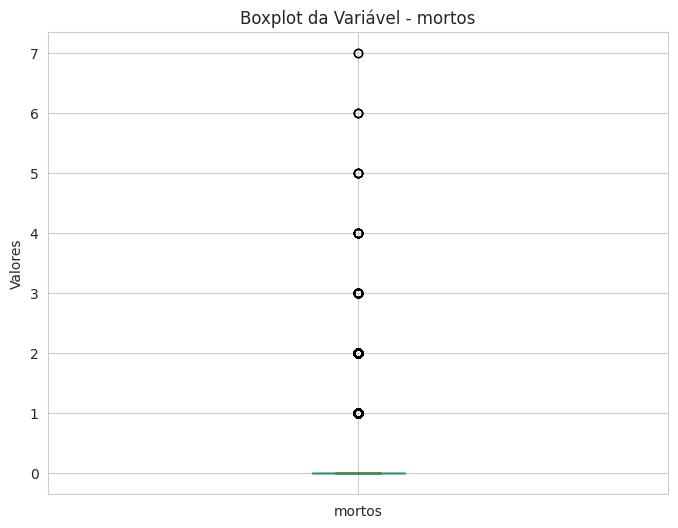

In [84]:
# Mostrar Box Plot para uma variável desejada
plt.figure(figsize=(8, 6))
df_prf_oco_01.boxplot(column='mortos')
plt.title('Boxplot da Variável - mortos')
plt.ylabel('Valores')
plt.show()

# Visão distribuida dos dados

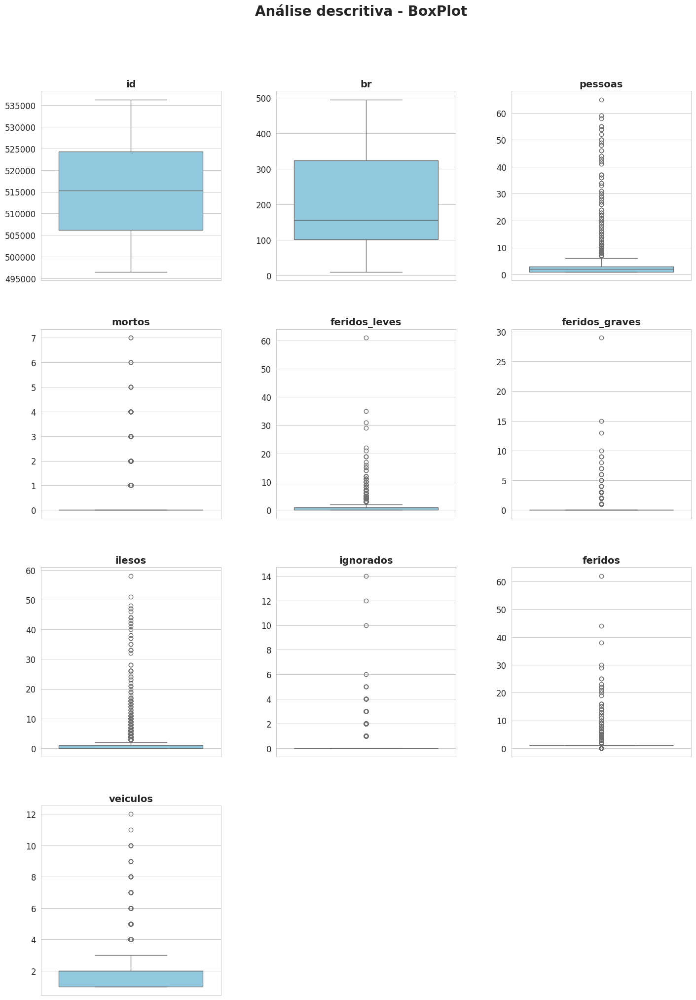

In [85]:
def pod_academy_box_plot(dataframe):
    """
    Plota boxplots estilizados com título simplificado para todas as variáveis numéricas do dataframe fornecido
    em um painel com 3 gráficos por linha.

    :param dataframe: DataFrame para o qual os boxplots serão gerados.
    """
    # Seleciona apenas colunas numéricas
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Define o número de linhas com base no número de colunas numéricas
    nrows = len(numeric_columns) // 3 + (len(numeric_columns) % 3 > 0)

    # Inicializa o painel de gráficos
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, nrows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=5)

    # Configura estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota boxplots para cada coluna numérica
    for i, column in enumerate(numeric_columns):
        sns.boxplot(data=dataframe[column], ax=axes[i//3, i%3], color="skyblue")
        axes[i//3, i%3].set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
        axes[i//3, i%3].set_ylabel('')
        axes[i//3, i%3].tick_params(axis='both', which='major', labelsize=12)

    # Remove gráficos vazios (se houver)
    for j in range(i+1, nrows*3):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle("Análise descritiva - BoxPlot", fontsize=20, fontweight='bold', y=1.05)

# Plotando os boxplots estilizados com títulos simplificados usando a função definida
pod_academy_box_plot(df_prf_oco_01)

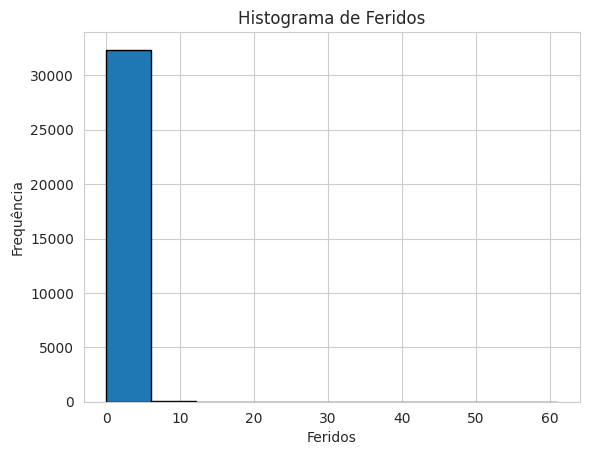

In [86]:
import matplotlib.pyplot as plt

# Histograma para a variável 'salario'
plt.hist(df_prf_oco_01['feridos_leves'].dropna(), bins=10, edgecolor='black')  # dropna() para excluir possíveis valores nulos
plt.xlabel('Feridos')
plt.ylabel('Frequência')
plt.title('Histograma de Feridos')
plt.show()

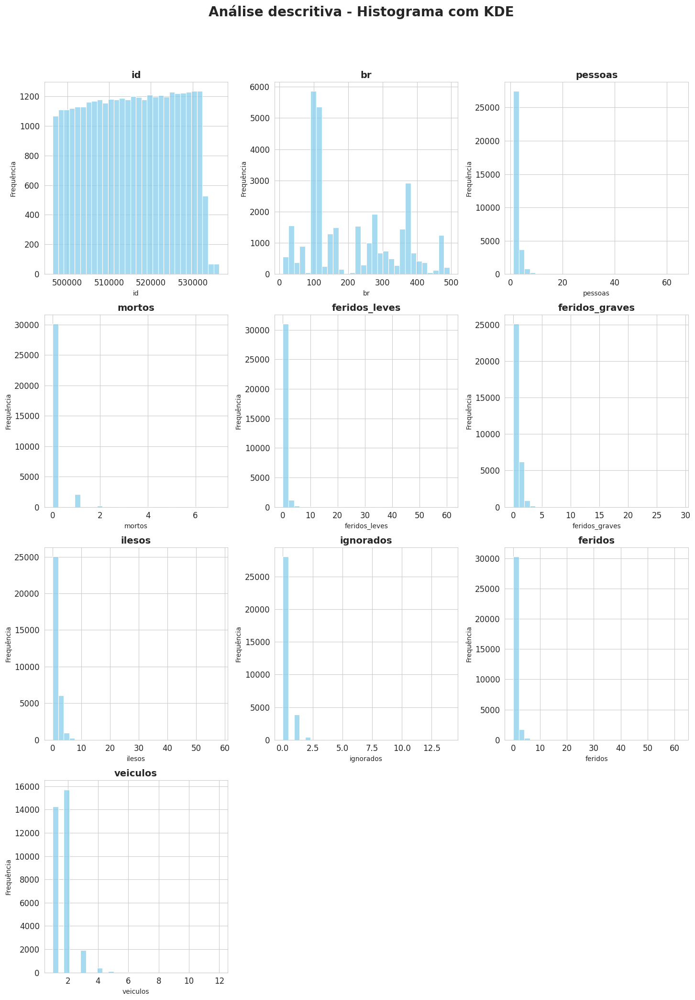

In [87]:
def pod_academy_histograms(dataframe):
    """
    Plota histogramas corrigidos com a curva KDE (Kernel Density Estimation) para todas as variáveis numéricas
    do dataframe fornecido em um painel com 3 gráficos por linha.

    :param dataframe: DataFrame para o qual os histogramas serão gerados.
    """
    # Seleciona apenas colunas numéricas
    numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

    # Define o número de linhas com base no número de colunas numéricas
    nrows = len(numeric_columns) // 3 + (len(numeric_columns) % 3 > 0)

    # Inicializa o painel de gráficos
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, nrows * 5))

    # Ajusta o layout
    plt.tight_layout(pad=4)

    # Configura estilo e paleta de cores
    sns.set_style("whitegrid")

    # Plota histogramas com KDE para cada coluna numérica
    for i, column in enumerate(numeric_columns):
        sns.histplot(data=dataframe[column], ax=axes[i//3, i%3], color="skyblue", bins=30, kde=False)
        axes[i//3, i%3].set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
        axes[i//3, i%3].set_ylabel('Frequência')
        axes[i//3, i%3].tick_params(axis='both', which='major', labelsize=12)

    # Remove gráficos vazios (se houver)
    for j in range(i+1, nrows*3):
        fig.delaxes(axes.flatten()[j])

    # Adiciona título principal
    fig.suptitle("Análise descritiva - Histograma com KDE", fontsize=20, fontweight='bold', y=1.05)

# Plotando os histogramas com KDE corrigidos em um painel usando a função definida
pod_academy_histograms(df_prf_oco_01)

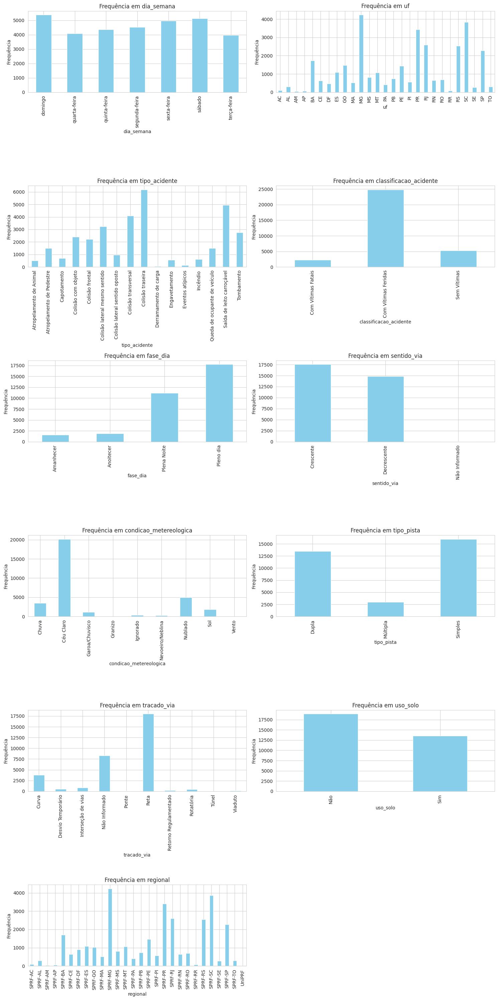

In [88]:
def plot_categorical_frequency_pt(df, corte_cardinalidade=30, graficos_por_linha=2):
    """
    Plota a frequência de categorias para variáveis categóricas em um DataFrame.

    Parâmetros:
    - df: DataFrame para plotagem.
    - corte_cardinalidade: Cardinalidade máxima para uma coluna ser considerada (padrão é 30).
    - graficos_por_linha: Quantidade de gráficos por linha (padrão é 3).

    Retorna:
    - Exibe os gráficos de barras.
    """

    # Gera metadados para o DataFrame
    metadados = []
    for coluna in df.columns:
        metadados.append({
            'Variável': coluna,
            'Tipo': df[coluna].dtype,
            'Cardinalidade': df[coluna].nunique()
        })

    df_metadados = pd.DataFrame(metadados)

    # Filtra colunas com cardinalidade maior que o corte e tipos não numéricos
    variaveis_categoricas = df_metadados[(df_metadados['Cardinalidade'] <= corte_cardinalidade) & (df_metadados['Tipo'] == 'object')]

    # Calcula o número de linhas e colunas para os subplots
    n_linhas = -(-len(variaveis_categoricas) // graficos_por_linha)  # Ceiling division
    n_colunas = min(len(variaveis_categoricas), graficos_por_linha)

    # Plota as variáveis categóricas
    fig, axs = plt.subplots(nrows=n_linhas, ncols=n_colunas, figsize=(15, 5 * n_linhas))

    for i, (idx, linha) in enumerate(variaveis_categoricas.iterrows()):
        var = linha['Variável']
        ax = axs[i // graficos_por_linha, i % graficos_por_linha]
        df[var].value_counts().sort_index().plot(kind='bar', ax=ax, color='skyblue')
        ax.set_title(f'Frequência em {var}')
        ax.set_ylabel('Frequência')
        ax.set_xlabel(var)

    # Remove os eixos vazios, se houver
    for j in range(i + 1, n_linhas * n_colunas):
        axs[j // graficos_por_linha, j % graficos_por_linha].axis('off')

    plt.tight_layout()
    plt.show()

# Testa a função com os dados e o corte padrão de cardinalidade
plot_categorical_frequency_pt(df_prf_oco_01, corte_cardinalidade=30, graficos_por_linha=2)

* Dias da Semana (dia_semana):

A maioria dos registros parece ocorrer nos finais de semana (sábado e domingo). Isso pode indicar um aumento de atividades ou eventos que resultam em mais registros nesses dias.

* UF (Estados):

Alguns estados têm uma contagem mais alta de registros em comparação com outros. Minas Gerais, Paraná e Santa Catarina são os estados com mais frequências de incidentes.

* Causa do Acidente (causa_acidente):

Alguns motivos parecem ser mais predominantes que outros. Por exemplo, "Colisão traseira" e "Tomabamento" parecem ser causas comuns, o que pode indicar a necessidade de campanhas de conscientização.

* Classificação do Acidente (classificacao_acidente):

A maioria dos acidentes parece ser com feridos leves, o que é uma boa notícia. No entanto, ainda há uma quantidade significativa de acidentes com feridos graves e mortos, ressaltando a importância da segurança no trânsito.

* Fase do Dia (fase_dia):

Os acidentes parecem ser mais comuns durante o dia, com picos no amanhecer e anoitecer. Isso pode estar relacionado às horas de pico de tráfego ou à visibilidade reduzida.

* Condição Meteorológica (condicao_metereologica):

A maioria dos registros ocorre em condições claras, o que é esperado, mas também destaca que condições adversas, como chuva ou neblina, não são os principais contribuintes para os acidentes, embora possam aumentar sua gravidade.

* Tipo de Pista (tipo_pista):

A maioria dos registros ocorre em pistas simples, o que pode indicar que essas pistas apresentam mais riscos ou que são mais comuns nas áreas abrangidas pelos dados.

* Tipos de Veículos(tipo_veiculo):

Os dois tipos de veiculos predominantes em incidentes são automóveis e motocicletas.

* Sexo

O sexo mascolino é o que está mais predominante entre os incidentes.

<Axes: >

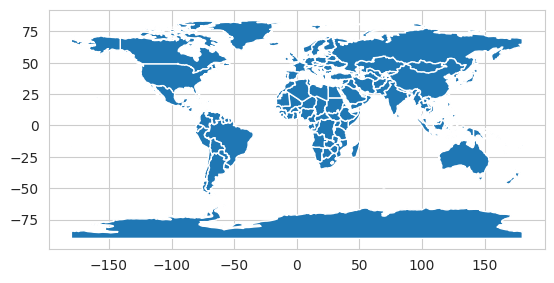

In [89]:
import geopandas as gpd

# Substitua pelo caminho completo do arquivo `.shp` descompactado
file_path = '/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/geodados_counties'

import geopandas as gpd
world = gpd.read_file(file_path)

# Visualizar o mapa do mundo
world.plot()

Index(['featurecla', 'scalerank', 'LABELRANK', 'SOVEREIGNT', 'SOV_A3',
       'ADM0_DIF', 'LEVEL', 'TYPE', 'TLC', 'ADMIN',
       ...
       'FCLASS_TR', 'FCLASS_ID', 'FCLASS_PL', 'FCLASS_GR', 'FCLASS_IT',
       'FCLASS_NL', 'FCLASS_SE', 'FCLASS_BD', 'FCLASS_UA', 'geometry'],
      dtype='object', length=169)


<Axes: >

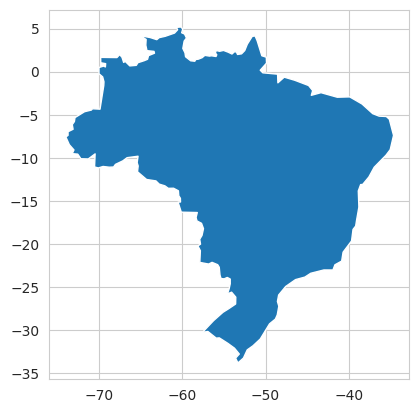

In [90]:
# Carregar o conjunto de dados manualmente
world = gpd.read_file(file_path)

# Verifique o nome das colunas
print(world.columns)

# Ajuste o nome da coluna conforme identificado
brazil = world[world['NAME'] == 'Brazil']  # Substitua 'NAME' pelo nome correto

# Plotar o mapa do Brasil
brazil.plot()

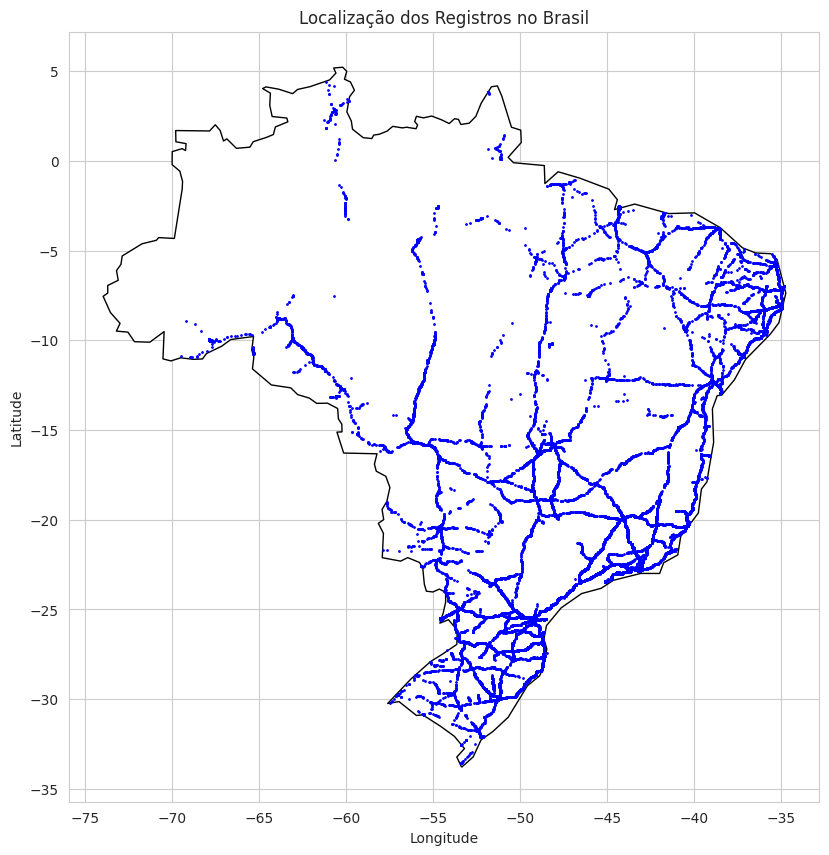

In [91]:
# Usando cordenadas geográficas para plotar no mapa do Brasil


import geopandas as gpd
import matplotlib.pyplot as plt

# Carrega o mapa do Brasil
world = gpd.read_file(file_path)
# Ajuste o nome da coluna conforme identificado
brazil = world[world['NAME'] == 'Brazil']
data = df_prf_oco_01
data_map = data.dropna(subset=['latitude', 'longitude'])

# Convertendo 'latitude' e 'longitude' para fomrato correto
data_map['latitude'] = data_map['latitude'].str.replace(',', '.').astype(float)
data_map['longitude'] = data_map['longitude'].str.replace(',', '.').astype(float)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
brazil.plot(ax=ax, color='white', edgecolor='black')
ax.scatter(data_map['longitude'], data_map['latitude'], color='blue', s=1)
plt.title('Localização dos Registros no Brasil')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [92]:
import folium

# Amostrar um subconjunto dos dados para garantir o desempenho
sample_data = data_map.sample(min(1000, len(data_map)))

# Criar um mapa base centralizado no Brasil
m = folium.Map(location=[-15.77972, -47.92972], zoom_start=4)  # Centered around Brasília

# Adicionar marcadores para cada registro nos dados amostrados
for idx, row in sample_data.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['causa_acidente'],
        icon=folium.Icon(icon="circle", color="blue", prefix='fa')
    ).add_to(m)

m


In [93]:
#
# Create a new base map centered around Brazil
m_corrected = folium.Map(location=[-15.77972, -47.92972], zoom_start=4)  # Centered around Brasília

# Add markers for each record in the sample data with special markers for fatal accidents
for idx, row in sample_data.iterrows():
    if "Com Vítimas Fatais" in row['classificacao_acidente']:
        icon_color = "red"
        icon_type = "times"
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['causa_acidente'],
            icon=folium.Icon(icon=icon_type, color=icon_color, prefix='fa')
        ).add_to(m_corrected)
    else:
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color="blue",
            fill=True,
            fill_color="blue",
            fill_opacity=0.6
        ).add_to(m_corrected)

m_corrected

In [94]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Supondo que você já tenha o DataFrame 'data'
# Verifique os tipos dos dados
print(data['latitude'].dtype)
print(data['longitude'].dtype)

# Tratar valores nulos, se necessário
data['latitude'] = data['latitude'].fillna('0')  # Ou outro valor que faça sentido
data['longitude'] = data['longitude'].fillna('0')  # Ou outro valor que faça sentido

# Converter 'latitude' e 'longitude' para o formato correto
data['latitude'] = data['latitude'].astype(str).str.replace(',', '.').astype(float)
data['longitude'] = data['longitude'].astype(str).str.replace(',', '.').astype(float)

# Criar um mapa básico centralizado no Brasil
m_heatmap = folium.Map(location=[-15.77972, -47.92972], zoom_start=4)

# Adicionar a camada de calor
heat_data = [[row['latitude'], row['longitude']] for index, row in data.iterrows()]
HeatMap(heat_data).add_to(m_heatmap)

m_heatmap


object
object


# Análise avançada:



*   Verificar se existem radares nas pistas em locais realmente
estratégicos


https://dados.gov.br/dados/conjuntos-dados/radar

In [95]:


import pandas as pd



# Especificar o delimitador como ponto e vírgula
df_radar_01 = pd.read_csv('/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/PRF/PRF.2023/dados_dos_radares.csv',
                           encoding='ISO-8859-1',
                           delimiter=';')  # ou use sep=';'

df_radar_01.shape



(722, 15)

In [96]:
df_radar_01.head()

,concessionaria,ano_do_pnv_snv,tipo_de_radar,rodovia,uf,km_m,municipio,tipo_pista,sentido,situacao,data_da_inativacao,latitude,longitude,velocidade_leve,velocidade_pesado
0,AUTOPISTA FERNÃO DIAS,2007,Controlador,BR-381,MG,"483,850",Betim,Principal,Crescente,Ativo,NaN,"-19,959486","-44,085386",80,60
1,AUTOPISTA FERNÃO DIAS,2007,Controlador,BR-381,MG,"493,290",Betim,Principal,Crescente,Ativo,NaN,"-19,964349","-44,171924",80,60
2,AUTOPISTA FERNÃO DIAS,2007,Controlador,BR-381,MG,"525,350",Brumadinho,Principal,Crescente,Ativo,NaN,"-20,146664","-44,323897",80,60
3,AUTOPISTA FERNÃO DIAS,2007,Controlador,BR-381,MG,"528,350",Brumadinho,Principal,Decrescente,Ativo,NaN,"-20,167194","-44,334434",80,60
4,AUTOPISTA FERNÃO DIAS,2007,Controlador,BR-381,MG,"568,890",Itaguara,Principal,Decrescente,Ativo,NaN,"-20,410679","-44,526628",80,60


In [97]:
# Convertendo as colunas de latitude e longitude para o formato correto
# df_radar_01['latitude'] = df_radar_01['latitude'].str.replace(',', '.')
# df_radar_01['longitude'] = df_radar_01['longitude'].str.replace(',', '.').astype(float)

In [98]:
import pandas as pd
import folium




# Ler o DataFrame (ajuste o caminho e o delimitador conforme necessário)
df_radar_01 = pd.read_csv('/content/drive/MyDrive/PODAcademy/Analista de dados/Dados/PRF/PRF.2023/dados_dos_radares.csv',
                           encoding='ISO-8859-1',
                           sep=';')  # Ajuste o separador conforme necessário

# Converter 'latitude' e 'longitude' para o formato correto
df_radar_01['latitude'] = df_radar_01['latitude'].str.replace(',', '.').astype(float)
df_radar_01['longitude'] = df_radar_01['longitude'].str.replace(',', '.').astype(float)

# Criar um mapa básico centralizado no Brasil
m_radar = folium.Map(location=[-15.77972, -47.92972], zoom_start=4)

# Adicionar marcadores para cada radar
for index, row in df_radar_01.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Radar: {row.get('nome_radar', 'Nome não disponível')}",  # Ajuste o nome da coluna conforme necessário
        icon=folium.Icon(color='blue')  # Você pode personalizar a cor do ícone
    ).add_to(m_radar)

# Exibir o mapa
m_radar



In [99]:
df_prf_oco_01.head()


,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,...,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,496519,2023-01-01,domingo,02:00:00,ES,101.0,114,SOORETAMA,Ausência de reação do condutor,Saída de leito carroçável,...,0,0,0,1,1,-19.094849,-40.050958,SPRF-ES,DEL04-ES,UOP01-DEL04-ES
1,496543,2023-01-01,domingo,03:40:00,SP,116.0,"113,1",TAUBATE,Entrada inopinada do pedestre,Atropelamento de Pedestre,...,0,0,4,0,1,-23.044566,-45.582598,SPRF-SP,DEL02-SP,UOP02-DEL02-SP
2,496590,2023-01-01,domingo,01:40:00,MT,163.0,1112,GUARANTA DO NORTE,Reação tardia ou ineficiente do condutor,Tombamento,...,1,0,0,1,1,-9.700206,-54.875888,SPRF-MT,DEL06-MT,UOP03-DEL06-MT
3,496610,2023-01-01,domingo,10:40:00,PR,376.0,"314,8",ORTIGUEIRA,Velocidade Incompatível,Tombamento,...,0,1,0,0,1,-23.985512,-51.083555,SPRF-PR,DEL07-PR,UOP02-DEL07-PR
4,496659,2023-01-01,domingo,14:55:00,MG,116.0,"569,4",MANHUACU,Acumulo de água sobre o pavimento,Colisão frontal,...,2,1,0,2,2,-20.100075,-42.178841,SPRF-MG,DEL06-MG,UOP03-DEL06-MG


In [100]:
import folium

# Criando o mapa novamente
mapa_brasil = folium.Map(location=[-15.77972, -47.92972], zoom_start=5)

# Adicionando os pontos referentes aos radares no mapa
for _, radar in df_radar_01.iterrows():
    folium.Marker(
        location=[radar['latitude'], radar['longitude']],
        popup=f"Rodovia: {radar['rodovia']} - Km: {radar['km_m']}",
        icon=folium.Icon(icon="cloud"),
    ).add_to(mapa_brasil)

mapa_brasil

In [101]:
# Filtrando acidentes fatais e com grande número de feridos
# Verificando a distribuição do número de feridos
descricao_feridos = df_prf_oco_01['feridos'].describe()

# Definindo um limiar para "grande número de feridos" como sendo o terceiro quartil
limiar_feridos = descricao_feridos['75%']
# acidentes_filtrados = df_prf_oco_01[(df_prf_oco_01['classificacao_acidente'] == 'Com Vítimas Fatais') | (df_prf_oco_01['feridos'] > limiar_feridos)]
acidentes_filtrados = df_prf_oco_01[(df_prf_oco_01['classificacao_acidente'] == 'Com Vítimas Fatais')]
acidentes_filtrados.shape
# Substituindo a vírgula por ponto nas colunas 'latitude' e 'longitude' e convertendo para float
# df_prf_oco_01['latitude'] = df_prf_oco_01['latitude'].str.replace(',', '.').astype(float)
# df_prf_oco_01['longitude'] = df_prf_oco_01['longitude'].str.replace(',', '.').astype(float)


(2319, 30)

In [102]:
acidentes_filtrados[['causa_acidente','classificacao_acidente','feridos','feridos_graves']].head()

,causa_acidente,classificacao_acidente,feridos,feridos_graves
1,Entrada inopinada do pedestre,Com Vítimas Fatais,0,0
12,Entrada inopinada do pedestre,Com Vítimas Fatais,0,0
22,Transitar na contramão,Com Vítimas Fatais,3,2
24,Reação tardia ou ineficiente do condutor,Com Vítimas Fatais,0,0
27,Transitar na contramão,Com Vítimas Fatais,2,1


In [103]:

# Criando um mapa centrado no Brasil
mapa_acidentes_radares = folium.Map(location=[-15.77972, -47.92972], zoom_start=5)

# Adicionando os pontos referentes aos acidentes no mapa
for _, acidente in acidentes_filtrados.iterrows():
    folium.CircleMarker(
        location=[acidente['latitude'], acidente['longitude']],
        radius=5,
        color="red",
        fill=True,
        fill_color="red",
        fill_opacity=0.6,
        popup=f"Rodovia: {acidente['br']} - Km: {acidente['km']} - Acidente: {acidente['classificacao_acidente']} - Causa: {acidente['causa_acidente']}"
    ).add_to(mapa_acidentes_radares)

# Adicionando os pontos referentes aos radares no mapa
for _, radar in df_radar_01.iterrows():
    folium.Marker(
        location=[radar['latitude'], radar['longitude']],
        icon=folium.Icon(icon="cloud", color="blue"),
        popup=f"Rodovia: {radar['rodovia']} - Km: {radar['km_m']} - Velocidade Limite: {radar['velocidade_leve']}"
    ).add_to(mapa_acidentes_radares)

mapa_acidentes_radares